# W207 Final Project – San Francisco Crime Classification
### Daghan, Jerry, and PJ

### Import libraries to facilitate data acquisition & processing, data exploration & visualization, feature engineering, and machine learning experimentation.

In [1]:
%matplotlib inline

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Data Structure
import numpy as np
import scipy as sp
import pandas as pd

# Machine Learning
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.decomposition import TruncatedSVD
from sklearn.metrics import log_loss

# Others
from datetime import datetime
import re
import zipfile
import os.path
import random

### Define Helper Functions

In [2]:
def print_full(statement):
    pd.set_option('display.max_rows', len(statement))
    print(statement)
    pd.reset_option('display.max_rows')

# DATA ACQUISITION

### Import Data from Kaggle: https://www.kaggle.com/c/sf-crime/data

In [3]:
# Load the training data and examine it
if os.path.isfile('./train.csv'):
    train_data = pd.read_csv('./train.csv')
else:
    z = zipfile.ZipFile('./train.csv.zip')
    train_data = pd.read_csv(z.open('train.csv'))

print("Shape of train_data:", train_data.shape)
train_data.head()

Shape of train_data: (878049, 9)


,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541


In [4]:
# Similarly, load the test data and examine it
if os.path.isfile('./test.csv'):
    test_data = pd.read_csv('./test.csv')
else:
    z = zipfile.ZipFile('./test.csv.zip')
    test_data = pd.read_csv(z.open('test.csv'))

print("Shape of test_data:", test_data.shape)
test_data.head()

Shape of test_data: (884262, 7)


,Id,Dates,DayOfWeek,PdDistrict,Address,X,Y
0,0,2015-05-10 23:59:00,Sunday,BAYVIEW,2000 Block of THOMAS AV,-122.399588,37.735051
1,1,2015-05-10 23:51:00,Sunday,BAYVIEW,3RD ST / REVERE AV,-122.391523,37.732432
2,2,2015-05-10 23:50:00,Sunday,NORTHERN,2000 Block of GOUGH ST,-122.426002,37.792212
3,3,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412
4,4,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412


In [5]:
# Import San Francisco map for visualization
map_data = np.loadtxt("./sf_map_copyright_openstreetmap_contributors.txt")
len_width_ratio = map_data.shape[0] * 1.0 / map_data.shape[1]

# DATA CLEANSING

In [6]:
print('Before data cleansing, the train data contain %d samples, the test data contain %d samples.' % \
      (train_data.shape[0], test_data.shape[0]))

# Drop samples containing null fields
train_data = train_data.dropna()

# The boundaries of valid longitude and latitude
lon_lat_box = (-122.5247, -122.3366, 37.699, 37.8299)

# Drop samples containing invalid longitude and latitude
train_data = train_data[train_data.X > lon_lat_box[0]]
train_data = train_data[train_data.X < lon_lat_box[1]]
train_data = train_data[train_data.Y > lon_lat_box[2]]
train_data = train_data[train_data.Y < lon_lat_box[3]]

print('After data cleansing, the train data contain %d samples, the test data contain %d samples.' % \
      (train_data.shape[0], test_data.shape[0]))

Before data cleansing, the train data contain 878049 samples, the test data contain 884262 samples.
After data cleansing, the train data contain 877982 samples, the test data contain 884262 samples.


# DATA EXPLORATION

In [7]:
# Show all available crime lables.
crime_categories = train_data['Category'].value_counts()
print('There are %d crime categories:' % (len(crime_categories)))
print(crime_categories)
crime_category_names = crime_categories.index

# Show the percentage of the mode in all data. If the prediction of the model is worse than always predicting the mode,
# then we should always predict the mode in the baseline establishment.
print('\nThe percentage of the LARCENY/THEFT is: ', crime_categories[0] * 1.0 / train_data.shape[0])

There are 39 crime categories:
LARCENY/THEFT                  174885
OTHER OFFENSES                 126165
NON-CRIMINAL                    92300
ASSAULT                         76872
DRUG/NARCOTIC                   53971
VEHICLE THEFT                   53772
VANDALISM                       44724
WARRANTS                        42206
BURGLARY                        36754
SUSPICIOUS OCC                  31412
MISSING PERSON                  25989
ROBBERY                         22999
FRAUD                           16679
FORGERY/COUNTERFEITING          10609
SECONDARY CODES                  9985
WEAPON LAWS                      8555
PROSTITUTION                     7484
TRESPASS                         7325
STOLEN PROPERTY                  4539
SEX OFFENSES FORCIBLE            4387
DISORDERLY CONDUCT               4318
DRUNKENNESS                      4280
RECOVERED VEHICLE                3138
KIDNAPPING                       2341
DRIVING UNDER THE INFLUENCE      2268
RUNAWAY            

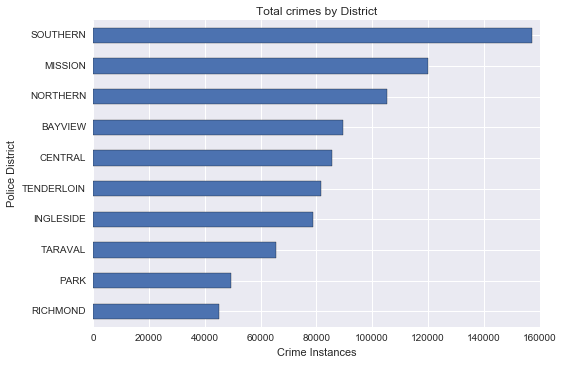

In [8]:
train_data["Category"].groupby(train_data["PdDistrict"]).count().sort_values().plot(kind='barh')
plt.title("Total crimes by District")
plt.xlabel("Crime Instances")
plt.ylabel("Police District")

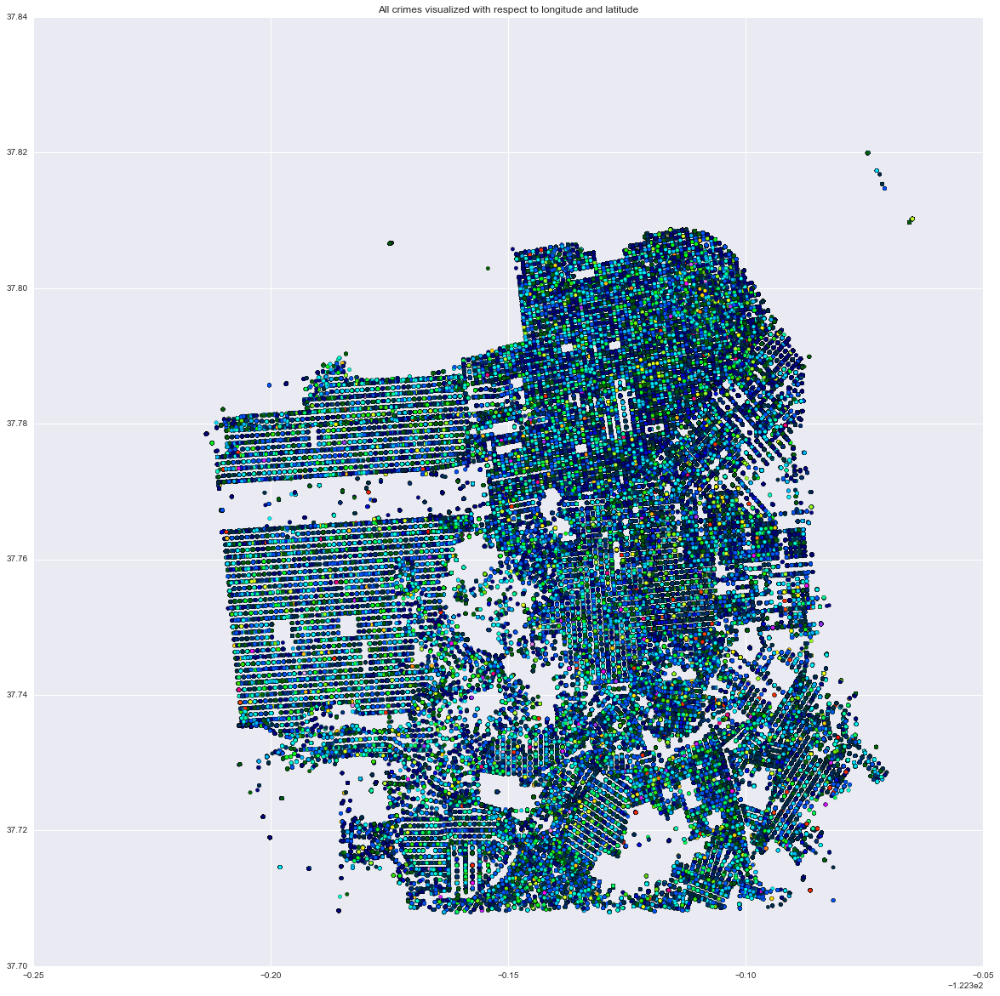

In [9]:
# Assign a color index to each crime category
color_map = dict(zip(crime_category_names, range(len(crime_categories))))

# Draw a scatter plot to show the crimes distribution
plt.figure(figsize=(20,20))
plt.scatter(train_data.X, train_data.Y, c=train_data.Category.map(color_map), cmap=plt.cm.gist_ncar)
plt.title("All crimes visualized with respect to longitude and latitude")

Apparently, the scatter plot with all crimes is not very helpful. Crimes happened everywhere, and we didn't get deeper insight. We will make the scatter plot of every crime separatedly at the next step.

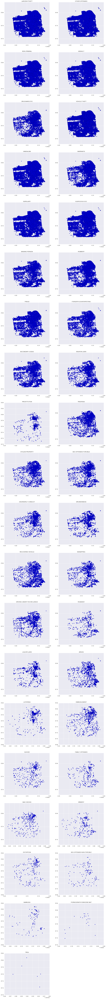

In [10]:
plt.figure(figsize=(16, 320))

for i in range(len(crime_category_names)):
    p = plt.subplot(40, 2, i+1)
    crime = crime_category_names[i]
    cur_crime_data = train_data[train_data.Category == crime]
    plt.title(crime)
    p.scatter(cur_crime_data.X, cur_crime_data.Y)

We can spot some trends with the scatterplots above, notably that some crimes are more prevalent at particular locations. For example, despite differing in total occurrences, Drug/Narcotic and Prostitution are both crimes that seem to have a high density on the Northeastern tip of SF. On the other hand, Vehicle Theft and Family Offenses are common in all areas of SF, and are spread out seemingly equally. Observing the density plots may help us to understand the concentration of various crimes, so we'll start with Prostitution and sex-related offenses.

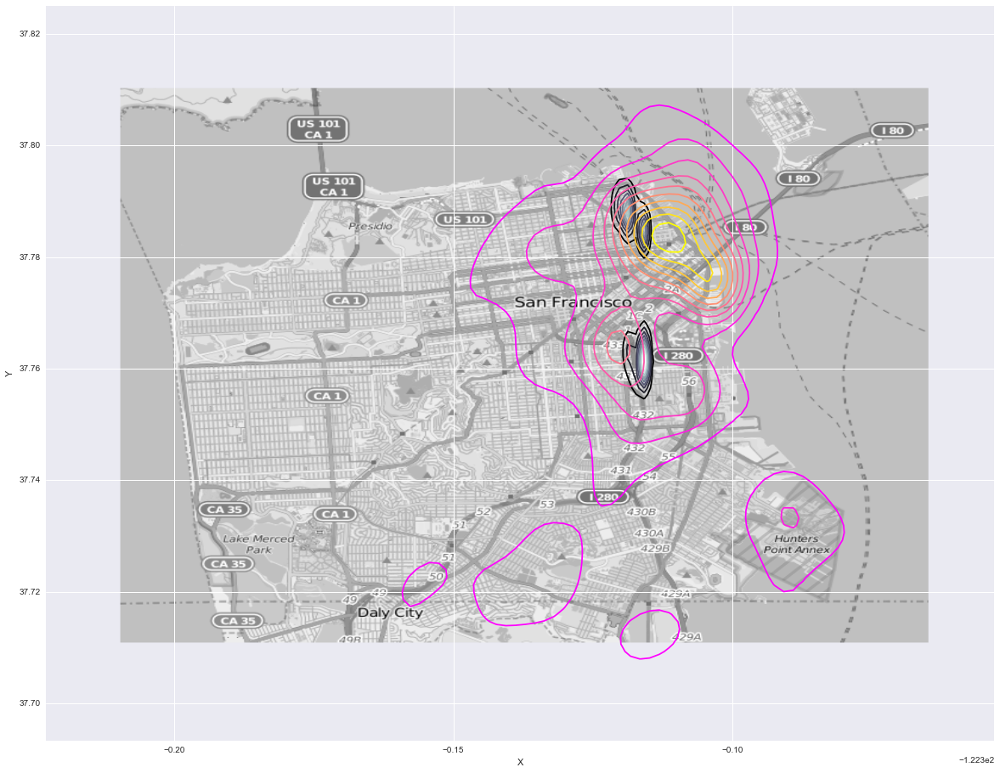

In [11]:
# Examine prostitution more closely and compare with other sex offenses

# First, filter relevant data from the training set
prostitution_data = train_data[train_data.Category == "PROSTITUTION"]
sex_offenses = train_data[(train_data.Category == "SEX OFFENSES FORCIBLE") | (train_data.Category == "SEX OFFENSES NON FORCIBLE")]

# Overlay the prostitution location density plot and the sex offenses location density plot over the SF map image
fig, ax = plt.subplots(figsize=(20, 20))
xy_lim = list((prostitution_data.X.min(), prostitution_data.X.max(), prostitution_data.Y.min(), prostitution_data.Y.max()))
plt.imshow(map_data, extent=xy_lim, cmap=plt.get_cmap('gray'))
sns.kdeplot(prostitution_data.X, prostitution_data.Y, n_levels=10, shade=False, cmap="bone")
sns.kdeplot(sex_offenses.X, sex_offenses.Y, n_levels=10, shade=False, cmap="spring")
plt.show()

We can observe that the densities for these sex-related crimes are different, and it may be useful to visualize others as well. However, as we saw with the scatterplots above, there are too many categories (30+) to observe on the same map to get a meaninful visual. Further categorization may be beneficial for co-plotting.

In [12]:
# This is an attempt to further categorize the crimes into 6 types + an "other" category

property_related = train_data[(train_data.Category == "LARCENY/THEFT") |
                              (train_data.Category == "VEHICLE THEFT") |
                              (train_data.Category == "VANDALISM") |
                              (train_data.Category == "BURGLARY") |
                              (train_data.Category == "TRESPASS") |
                              (train_data.Category == "STOLEN PROPERTY") |
                              (train_data.Category == "RECOVERED VEHICLE") |
                              (train_data.Category == "ARSON") |
                              (train_data.Category == "ROBBERY")]

person_related = train_data[(train_data.Category == "ASSAULT") |
                              (train_data.Category == "MISSING PERSON") |
                              (train_data.Category == "ROBBERY") |
                              (train_data.Category == "KIDNAPPING") |
                              (train_data.Category == "RUNAWAY") |
                              (train_data.Category == "FAMILY OFFENSES") |
                              (train_data.Category == "SUICIDE")]

drugs_sex_gambling_related = train_data[(train_data.Category == "DRUG/NARCOTIC") |
                              (train_data.Category == "DRUNKENNESS") |
                              (train_data.Category == "LIQUOR LAWS") |
                              (train_data.Category == "DRIVING UNDER THE INFLUENCE") |
                              (train_data.Category == "PROSTITUTION") |
                              (train_data.Category == "SEX OFFENSES FORCIBLE") |
                              (train_data.Category == "SEX OFFENSES NON FORCIBLE") |
                              (train_data.Category == "PORNOGRAPHY/OBSCENE MAT") |
                              (train_data.Category == "GAMBLING")]

weapon_violence_related = train_data[(train_data.Category == "WEAPON LAWS") |
                              (train_data.Category == "ARSON") |
                              (train_data.Category == "SEX OFFENSES FORCIBLE")]

fraudulent_behavior_related = train_data[(train_data.Category == "FRAUD") |
                              (train_data.Category == "FORGERY/COUNTERFEITING") |
                              (train_data.Category == "BAD CHECKS") |
                              (train_data.Category == "EMBEZZLEMENT") |
                              (train_data.Category == "BRIBERY") |
                              (train_data.Category == "EXTORTION") |
                              (train_data.Category == "TREA")]

general_misconduct_related = train_data[(train_data.Category == "LOITERING") |
                              (train_data.Category == "DISORDERLY CONDUCT") |
                              (train_data.Category == "SUSPICIOUS OCC")]

other_related = train_data[(train_data.Category == "OTHER OFFENSES") |
                              (train_data.Category == "NON-CRIMINAL") |
                              (train_data.Category == "WARRANTS") |
                              (train_data.Category == "SECONDARY CODES")]

Now that there are only 7 categories, we could try co-plotting the primary 6 and inspecting the "other" crimes

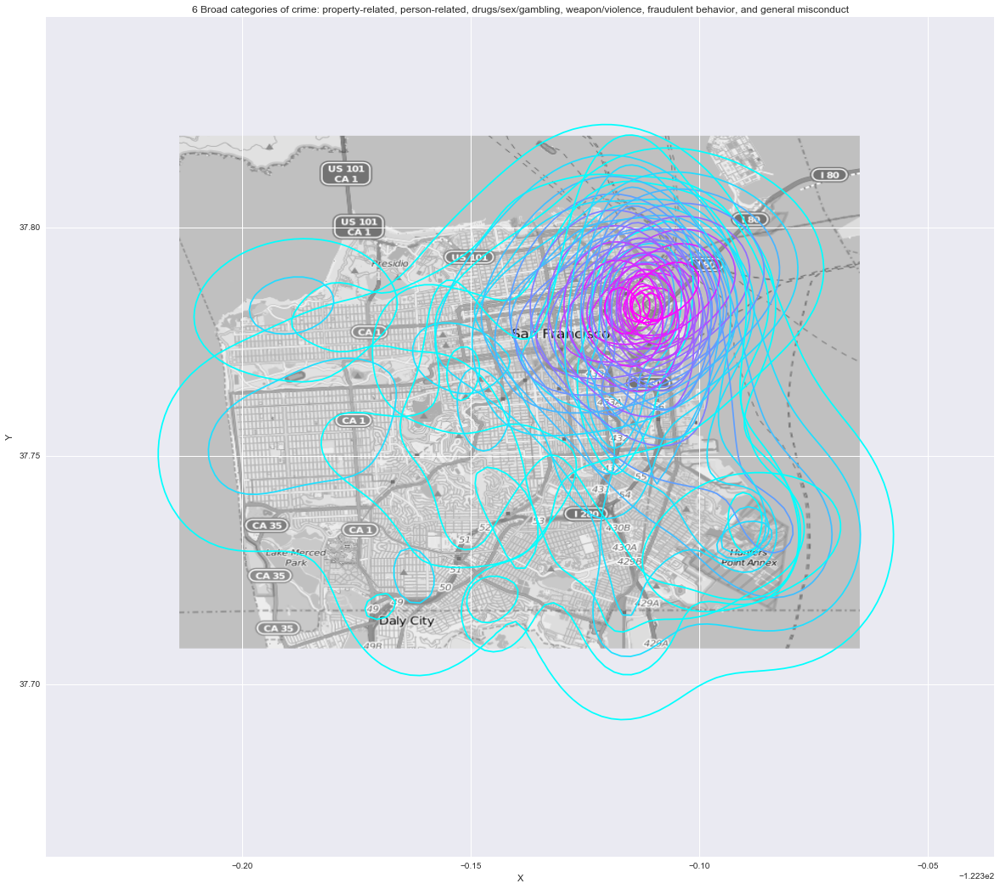

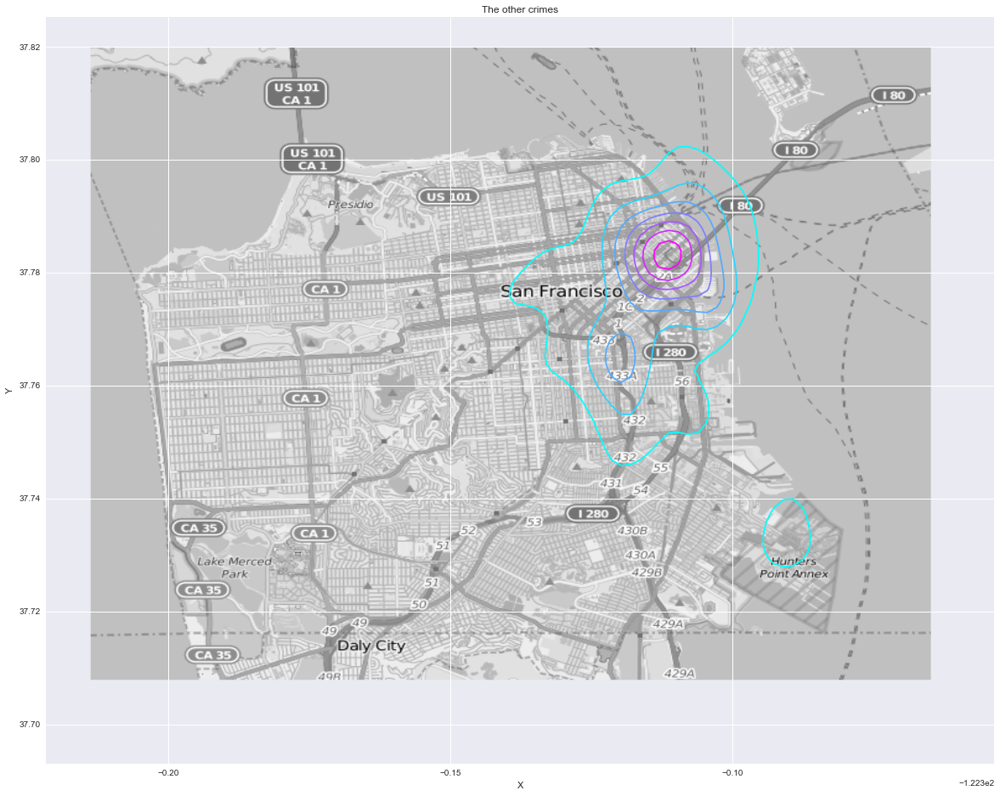

In [13]:
# Examine the 6 broader categories of crime
fig, ax = plt.subplots(figsize=(20, 20))
xy_lim = list((train_data.X.min(), train_data.X.max(), train_data.Y.min(), train_data.Y.max()))

plt.imshow(map_data, extent=xy_lim, cmap=plt.get_cmap('gray'))
for df, name in zip([property_related, person_related, drugs_sex_gambling_related, weapon_violence_related,
                     fraudulent_behavior_related, general_misconduct_related], 
                    ["Property-related", "Person-related", "Drugs/Sex/Gambling", "Weapon/Violence",
                     "Fraudulent Behavior", "General Misconduct"]):
    shuffle = np.random.permutation(np.arange(df.shape[0]))
    samples = df.iloc[shuffle][:len(df)//1000]
    sns.kdeplot(samples.X, samples.Y, n_levels=10, shade=False, cmap="cool")
plt.title("6 Broad categories of crime: property-related, person-related, drugs/sex/gambling, weapon/violence, fraudulent behavior, and general misconduct")
plt.show()

# Examine "Other Crimes" as the 7th category
fig, ax = plt.subplots(figsize=(20, 20))
xy_lim = list((other_related.X.min(), other_related.X.max(), other_related.Y.min(), other_related.Y.max()))

plt.imshow(map_data, extent=xy_lim, cmap=plt.get_cmap('gray'))
shuffle = np.random.permutation(np.arange(other_related.shape[0]))
samples = other_related.iloc[shuffle][:len(other_related)//100]
sns.kdeplot(samples.X, samples.Y, n_levels=10, shade=False, cmap="cool")
plt.title("The other crimes")
plt.show()

Even though fewer categories were used, the co-plot still looks messy. One immediate insight that can be gleaned is that highest crime densities, regardless of the category, are situated in the Northeastern Tip. "Other," nonspecific crimes do not tend to deviate past this hub, perhaps indicating that crime in Western SF may be more likely to be specific (or police are more likely to categorize it as specific, and hence issue an arrest under this more specific category)

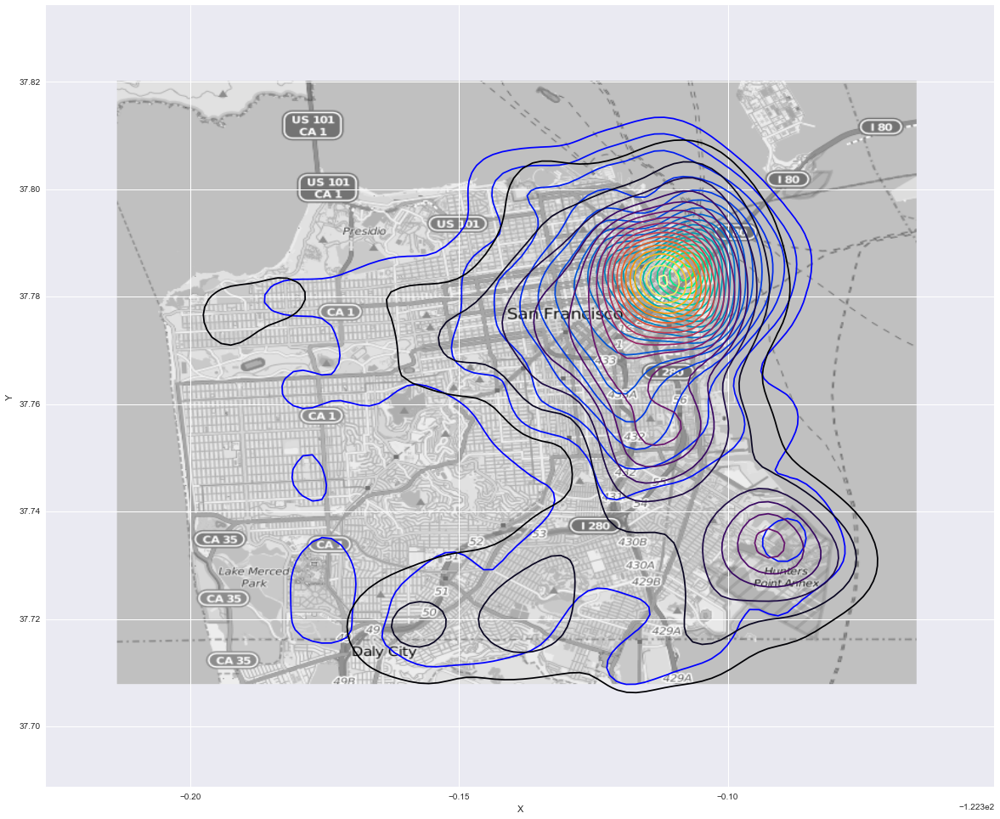

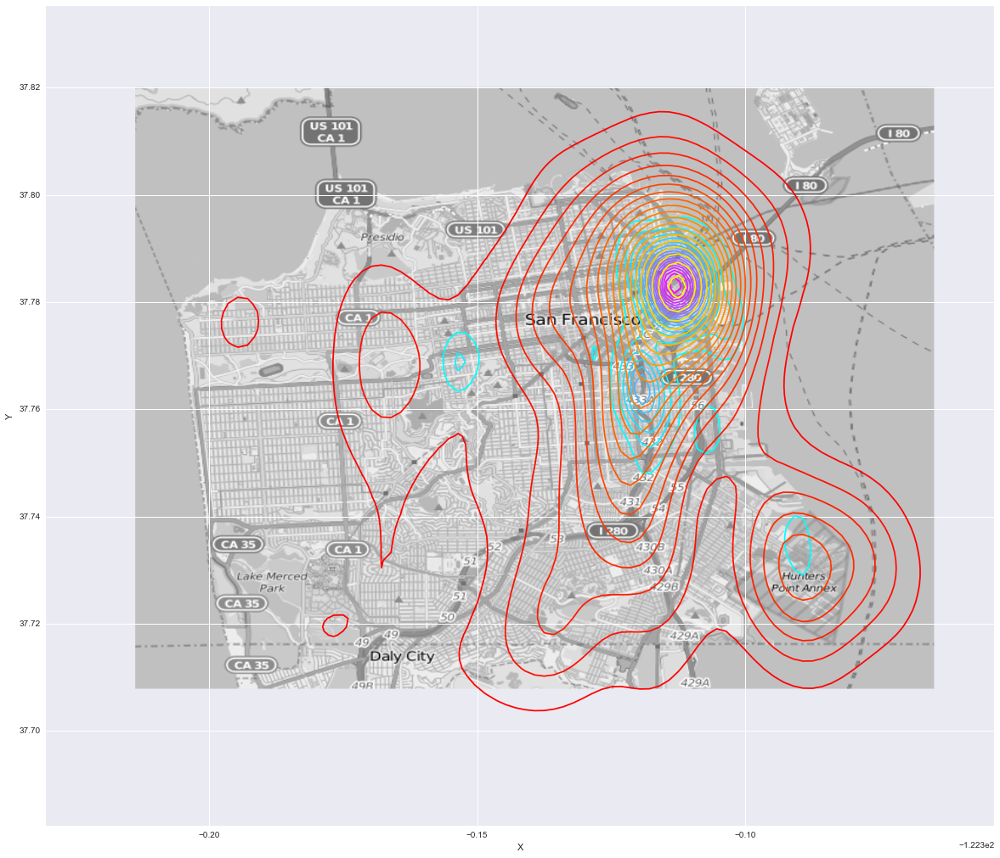

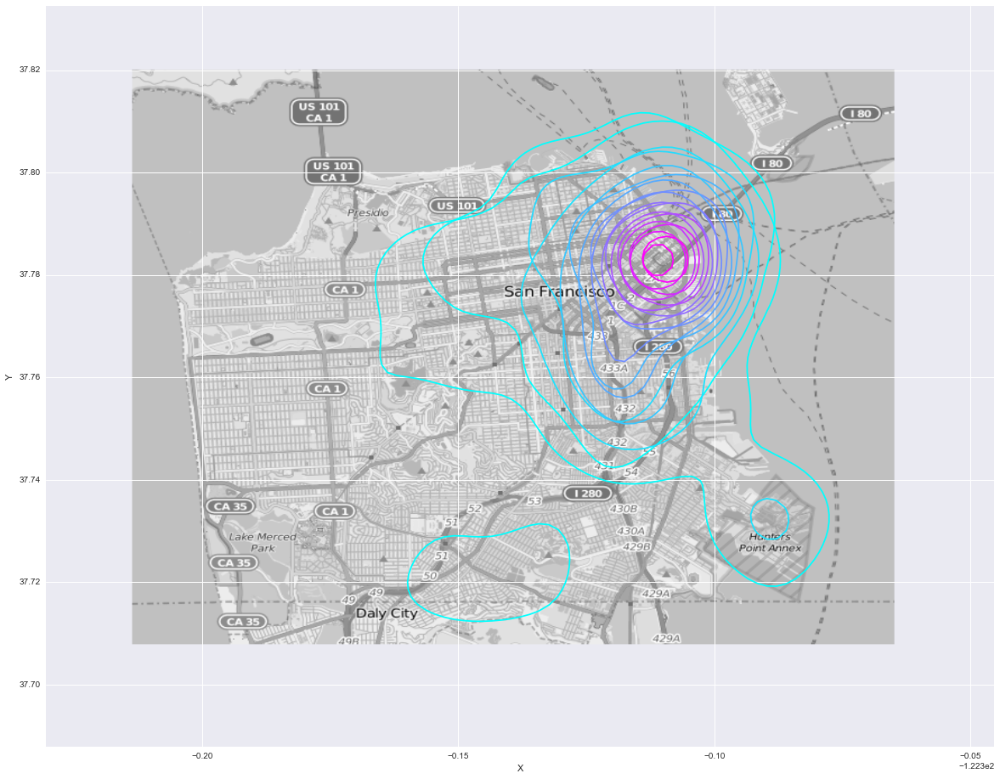

In [14]:
# Visualize density plots for the broad categories against each other

# Do property-related and person-related crimes occur in the same places?
fig, ax = plt.subplots(figsize=(20, 20))
xy_lim = list((train_data.X.min(), train_data.X.max(), train_data.Y.min(), train_data.Y.max()))

plt.imshow(map_data, extent=xy_lim, cmap=plt.get_cmap('gray'))
for df, name, col in zip([property_related, person_related], ["Property-related", "Person-related"], ["winter", "inferno"]):
    shuffle = np.random.permutation(np.arange(df.shape[0]))
    samples = df.iloc[shuffle][:len(df)//100]
    sns.kdeplot(samples.X, samples.Y, n_levels=20, shade=False, cmap=col)
plt.show()

# How about drugs, sex, and gambling versus weapon/violence?
fig, ax = plt.subplots(figsize=(20, 20))
xy_lim = list((train_data.X.min(), train_data.X.max(), train_data.Y.min(), train_data.Y.max()))

plt.imshow(map_data, extent=xy_lim, cmap=plt.get_cmap('gray'))
for df, name, col in zip([drugs_sex_gambling_related, weapon_violence_related], ["Drugs/Sex/Gambling", "Weapon/Violence"], ["cool", "autumn"]):
    shuffle = np.random.permutation(np.arange(df.shape[0]))
    samples = df.iloc[shuffle][:len(df)//100]
    sns.kdeplot(samples.X, samples.Y, n_levels=20, shade=False, cmap=col)
plt.show()

# What about fradulent behavior and (typically less serious) general misconduct?
fig, ax = plt.subplots(figsize=(20, 20))
xy_lim = list((train_data.X.min(), train_data.X.max(), train_data.Y.min(), train_data.Y.max()))

plt.imshow(map_data, extent=xy_lim, cmap=plt.get_cmap('gray'))
for df, name, col in zip([fraudulent_behavior_related, general_misconduct_related], ["Fraudulent Behavior", "General Misconduct"], ["cool", "autumn"]):
    shuffle = np.random.permutation(np.arange(df.shape[0]))
    samples = df.iloc[shuffle][:len(df)//100]
    sns.kdeplot(samples.X, samples.Y, n_levels=10, shade=False, cmap="cool")
plt.show()

In [15]:
train_data["Dates"] = pd.to_datetime(train_data["Dates"], format="%Y-%m-%d %H:%M:%S")
train_data["Hour"] = train_data["Dates"].map(lambda x: x.hour)
train_data["Month"] = train_data["Dates"].map(lambda x: x.month)
train_data["Year"] = train_data["Dates"].map(lambda x: x.year)

In [16]:
# Kernel dies whenever I try to plot hourly data for all crimes

# plt.figure(figsize=(20,20))
# hourly_data = {}
# for hour in train_data.Hour.unique():
#     hourly_data[hour] = len(train_data[train_data.Hour] == hour)
# sns.tsplot(data=list(hourly_data.values()), time=list(hourly_data.keys()))
# plt.title("All crimes by the hour")

CAUTION: SCALES ARE DIFFERENT (so only use to notice the trend)


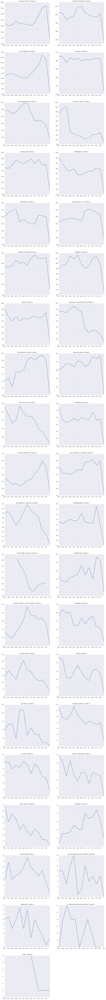

In [17]:
# By the year
plt.figure(figsize=(16, 320))
print("CAUTION: SCALES ARE DIFFERENT (so only use to notice the trend)")
for i in range(len(crime_category_names)):
    p = plt.subplot(40, 2, i+1)
    crime = crime_category_names[i]
    cur_crime_data = train_data[train_data.Category == crime]
    yearly_data = {}
    for year in cur_crime_data.Year.unique():
        yearly_data[year] = len(cur_crime_data[(cur_crime_data.Year == year)])
    sns.tsplot(data=list(yearly_data.values()), time=list(yearly_data.keys()))
    plt.xticks(np.arange(train_data.Year.unique().min(),train_data.Year.unique().max(),1))
    plt.title(crime + " (YEARLY)")

CAUTION: SCALES ARE DIFFERENT (so only use to notice the trend)


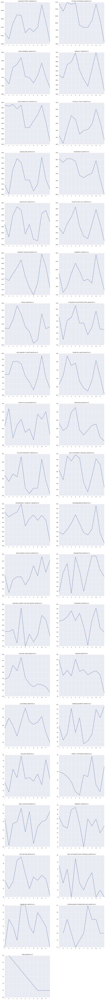

In [18]:
# By the month
plt.figure(figsize=(16, 320))
print("CAUTION: SCALES ARE DIFFERENT (so only use to notice the trend)")
for i in range(len(crime_category_names)):
    p = plt.subplot(40, 2, i+1)
    crime = crime_category_names[i]
    cur_crime_data = train_data[train_data.Category == crime]
    monthly_data = {}
    for month in cur_crime_data.Month.unique():
        monthly_data[month] = len(cur_crime_data[(cur_crime_data.Month == month)])
    sns.tsplot(data=list(monthly_data.values()), time=list(monthly_data.keys()))
    plt.xticks(np.arange(train_data.Month.unique().min(),train_data.Month.unique().max(),1))
    plt.title(crime + " (MONTHLY)")
    

CAUTION: SCALES ARE DIFFERENT (so only use to notice the trend)


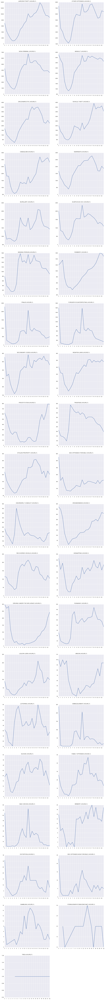

In [19]:
# By the hour
plt.figure(figsize=(16, 320))
print("CAUTION: SCALES ARE DIFFERENT (so only use to notice the trend)")
for i in range(len(crime_category_names)):
    p = plt.subplot(40, 2, i+1)
    crime = crime_category_names[i]
    cur_crime_data = train_data[train_data.Category == crime]
    hourly_data = {}
    for hour in cur_crime_data.Hour.unique():
        hourly_data[hour] = len(cur_crime_data[(cur_crime_data.Hour == hour)])
    sns.tsplot(data=list(hourly_data.values()), time=list(hourly_data.keys()))
    plt.xticks(np.arange(train_data.Hour.unique().min(),train_data.Hour.unique().max(),1))
    plt.title(crime + " (HOURLY)")

In [20]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 877982 entries, 0 to 878048
Data columns (total 12 columns):
Dates         877982 non-null datetime64[ns]
Category      877982 non-null object
Descript      877982 non-null object
DayOfWeek     877982 non-null object
PdDistrict    877982 non-null object
Resolution    877982 non-null object
Address       877982 non-null object
X             877982 non-null float64
Y             877982 non-null float64
Hour          877982 non-null int64
Month         877982 non-null int64
Year          877982 non-null int64
dtypes: datetime64[ns](1), float64(2), int64(3), object(6)
memory usage: 87.1+ MB


# Feature Engineering

In [7]:
# Transform the Date into a python datetime object.
train_data["Dates"] = pd.to_datetime(train_data["Dates"], format="%Y-%m-%d %H:%M:%S")
test_data["Dates"] = pd.to_datetime(test_data["Dates"], format="%Y-%m-%d %H:%M:%S")

In [8]:
# Add Minute
train_data["Minute"] = train_data["Dates"].map(lambda x: x.minute)
test_data["Minute"] = test_data["Dates"].map(lambda x: x.minute)
    
print(sorted(train_data['Minute'].unique()))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]


In [9]:
# Add Hour
train_data["Hour"] = train_data["Dates"].map(lambda x: x.hour)
test_data["Hour"] = test_data["Dates"].map(lambda x: x.hour)
    
print(sorted(train_data['Hour'].unique()))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]


In [10]:
# Add Month
train_data["Month"] = train_data["Dates"].map(lambda x: x.month - 1)
test_data["Month"] = test_data["Dates"].map(lambda x: x.month - 1)
    
print(sorted(train_data['Month'].unique()))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]


In [11]:
# Add Year
train_data["Year"] = train_data["Dates"].map(lambda x: x.year - 2003)   
test_data["Year"] = test_data["Dates"].map(lambda x: x.year - 2003)

print(sorted(train_data['Year'].unique()))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


In [12]:
# Add Hour Zone
def get_hour_zone(hour):
    if hour >= 2 and hour < 8: 
        return 0;
    if hour >= 8 and hour < 12: 
        return 1;
    if hour >= 12 and hour < 18: 
        return 2;
    if hour >= 18 and hour < 22: 
        return 3;
    if hour < 2 or hour >= 22: 
        return 4;
    
train_data["Hour_Zone"] = train_data["Hour"].apply(get_hour_zone)
test_data["Hour_Zone"] = test_data["Hour"].apply(get_hour_zone)

print(sorted(train_data['Hour_Zone'].unique()))

[0, 1, 2, 3, 4]


In [13]:
# Add Week of Year
train_data["WeekOfYear"] = train_data["Dates"].map(lambda x: x.weekofyear / 2 - 1)
test_data["WeekOfYear"] = test_data["Dates"].map(lambda x: x.weekofyear / 2)

print(sorted(train_data['WeekOfYear'].unique()))
print(sorted(test_data['WeekOfYear'].unique()))

[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0]
[0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5, 8.5, 9.5, 10.5, 11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5, 22.5, 23.5, 24.5, 25.5, 26.5]


In [14]:
# Transform the DayOfWeek to catogorical data
dayofweek_encoder = LabelEncoder()
dayofweek_encoder.fit(train_data['DayOfWeek'])

train_data["DayOfWeek_Category"] = dayofweek_encoder.transform(train_data['DayOfWeek'])
test_data["DayOfWeek_Category"] = dayofweek_encoder.transform(test_data['DayOfWeek'])

print(sorted(train_data['DayOfWeek_Category'].unique()))

train_data["Is_Weekday"] = train_data["DayOfWeek"].map(lambda day: 1 if day in set(['Sunday', 'Saturday']) else 0)
test_data["Is_Weekday"] = test_data["DayOfWeek"].map(lambda day: 1 if day in set(['Sunday', 'Saturday']) else 0)

print(sorted(train_data['Is_Weekday'].unique()))

[0, 1, 2, 3, 4, 5, 6]
[0, 1]


In [15]:
# Add the street names as new feature. The address either contains one street, or it the intersection of two streets.
print('Before Transformation:')
print_full(train_data['Address'].head(20))

def extract_street1(address, seen_streets=None):
    street1 = address.split(' / ')[0]
    if seen_streets is None or street1 in seen_streets:
        return street1
    else:
        return 'None'

def extract_street2(address, seen_streets=None):
    streets = address.split(' / ')
    street2 = 'None' if len(streets) == 1 else streets[1]
    if seen_streets is None or street2 in seen_streets:
        return street2
    else:
        return 'None'

# Remove the block number from the address and divide the address into street1 and street2
re_pattern = '[0-9]+ Block of '
addresses = train_data["Address"].map(lambda address: re.sub(re_pattern, '', address))
train_data["Street1"] = addresses.apply(extract_street1)
train_data["Street2"] = addresses.apply(extract_street2)

seen_streets = set(train_data['Street1'].append(train_data['Street2']).unique())
seen_streets.discard('None')
print('\nThe number of unique streets in the train data is %d' % (len(seen_streets),))
print('There are %d unique street1 values, %d unique street2 value\n' % (train_data['Street1'].nunique(), 
                                                                         train_data['Street2'].nunique()))
addresses = test_data["Address"].map(lambda address: re.sub(re_pattern, '', address))
test_data["Street1"] = addresses.apply(extract_street1, args=(seen_streets,))
test_data["Street2"] = addresses.apply(extract_street2, args=(seen_streets,))

print('After Transformation:')
print_full(train_data['Street1'].head(20))
print_full(train_data['Street2'].head(20))

# Transform the Address to catogorical data
street_encoder = LabelEncoder()
seen_streets = list(seen_streets) + ['None']
street_encoder.fit(seen_streets)
train_data["Street1"] = street_encoder.transform(train_data['Street1'])
train_data["Street2"] = street_encoder.transform(train_data['Street2'])
test_data["Street1"] = street_encoder.transform(test_data['Street1'])
test_data["Street2"] = street_encoder.transform(test_data['Street2'])

# Exchange street1 and stree2 values to ensure that scale value of street1 is smaller greater than street2
# This step is to avoid the model from thinking "street1, street2" != "street2, street1"
for index, row in train_data.iterrows():
    if row['Street1'] > row['Street2']:
        row['Street1'], row['Street2'] = row['Street2'], row['Street1']

for index, row in test_data.iterrows():
    if row['Street1'] > row['Street2']:
        row['Street1'], row['Street2'] = row['Street2'], row['Street1']

Before Transformation:
0                OAK ST / LAGUNA ST
1                OAK ST / LAGUNA ST
2         VANNESS AV / GREENWICH ST
3          1500 Block of LOMBARD ST
4         100 Block of BRODERICK ST
5               0 Block of TEDDY AV
6               AVALON AV / PERU AV
7          KIRKWOOD AV / DONAHUE ST
8              600 Block of 47TH AV
9     JEFFERSON ST / LEAVENWORTH ST
10    JEFFERSON ST / LEAVENWORTH ST
11            0 Block of ESCOLTA WY
12               TURK ST / JONES ST
13           FILLMORE ST / GEARY BL
14         200 Block of WILLIAMS AV
15            0 Block of MENDELL ST
16               EDDY ST / JONES ST
17           GODEUS ST / MISSION ST
18           MENDELL ST / HUDSON AV
19            100 Block of JONES ST
Name: Address, dtype: object

The number of unique streets in the train data is 2075
There are 2033 unique street1 values, 1691 unique street2 value

After Transformation:
0           OAK ST
1           OAK ST
2       VANNESS AV
3       LOMBARD ST
4     BRO

In [16]:
# Add the address type as a categorical feature 
valid_street_types = ['AL', 'AV', 'BL', 'BU', 'CR', 'CT', 'DR', 'EX', 'FE', 'HW', 'HY', 'LN', 'MA',
                      'PA', 'PL', 'PZ', 'RD', 'RW', 'ST', 'TE', 'TR', 'WA', 'WK', 'WY']
street_type_encoder = LabelEncoder()
street_type_encoder.fit(valid_street_types + ['OT'])

train_streets = street_encoder.inverse_transform(train_data["Street1"])
train_streets = train_streets.reshape(train_streets.shape[0], 1)
train_street_types = np.apply_along_axis(lambda street: street[0].split()[-1], 1, train_streets)
train_street_types = train_street_types.reshape(train_street_types.shape[0], 1)
train_street_types = np.apply_along_axis(lambda street_type: street_type if street_type in valid_street_types else 'OT', 
                                         1, train_street_types)

train_data['Street_Type'] = street_type_encoder.transform(train_street_types.reshape(train_street_types.shape[0], 1))
print(sorted(train_data['Street_Type'].unique()))

test_streets = street_encoder.inverse_transform(test_data["Street1"])
test_streets = test_streets.reshape(test_streets.shape[0], 1)
test_street_types = np.apply_along_axis(lambda street: street[0].split()[-1], 1, test_streets)
test_street_types = test_street_types.reshape(test_street_types.shape[0], 1)
test_street_types = np.apply_along_axis(lambda street_type: street_type if street_type in valid_street_types else 'OT', 
                                        1, test_street_types)

test_data['Street_Type'] = street_type_encoder.transform(test_street_types.reshape(test_street_types.shape[0], 1))
print(sorted(test_data['Street_Type'].unique()))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]
[0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]


/Users/PJ/anaconda/envs/python3/lib/python3.5/site-packages/sklearn/preprocessing/label.py:147: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [17]:
# Whether the address locates at the intersection of two streets
train_data["Is_Intersection"] = train_data["Address"].map(lambda address: 0 if ' / ' in address else 1)
test_data["Is_Intersection"] = test_data["Address"].map(lambda address: 0 if ' / ' in address else 1)

print(sorted(train_data['Is_Intersection'].unique()))

[0, 1]


In [18]:
# Whether the address locates at a block
train_data["Is_Block"] = train_data["Address"].map(lambda address: 0 if 'Block' in address else 1)
test_data["Is_Block"] = test_data["Address"].map(lambda address: 0 if 'Block' in address else 1)

print(sorted(train_data['Is_Block'].unique()))

[0, 1]


In [19]:
# Transform the PdDistrict to catogorical data
discrict_encoder = LabelEncoder()
discrict_encoder.fit(train_data['PdDistrict'])

train_data["PdDistrict_Category"] = discrict_encoder.transform(train_data['PdDistrict'])
test_data["PdDistrict_Category"] = discrict_encoder.transform(test_data['PdDistrict'])

print(sorted(train_data['PdDistrict_Category'].unique()))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


In [20]:
# Normalize X and Y
print('There are %d unique longitude values, %d unique latitude values' % (train_data['X'].nunique(), 
                                                                           train_data['Y'].nunique()))
round_precision = 6
train_data['Long'] = train_data["X"].apply(round, args=(round_precision,))
train_data['Lat'] = train_data["Y"].apply(round, args=(round_precision,))
test_data['Long'] = test_data["X"].apply(round, args=(round_precision,))
test_data['Lat'] = test_data["Y"].apply(round, args=(round_precision,))

xy_scalar = preprocessing.StandardScaler().fit(train_data[['Long', 'Lat']])
train_data[['Long', 'Lat']] = xy_scalar.transform(train_data[['Long', 'Lat']])
test_data[['Long', 'Lat']] = xy_scalar.transform(test_data[['Long', 'Lat']])

There are 34242 unique longitude values, 34242 unique latitude values


In [21]:
# X-Y plane rotation and system transformation to extract more spatial information
# Based on below functions:
# rotated x = xcos + ysin
# rotated y = ycos - xsin
# cardinal space -> polar space

train_data["Rot45_X"] = .707 * train_data['Lat'] + .707 * train_data['Long'] 
train_data["Rot45_Y"] = .707 * train_data['Lat'] - .707 * train_data['Long']
train_data["Rot30_X"] = (1.732/2) * train_data['Long'] + (1./2) * train_data['Lat'] 
train_data["Rot30_Y"] = (1.732/2) * train_data['Lat'] - (1./2) * train_data['Long']
train_data["Rot60_X"] = (1./2) * train_data['Long'] + (1.732/2) * train_data['Lat'] 
train_data["Rot60_Y"] = (1./2) * train_data['Lat'] - (1.732/2) * train_data['Long']
train_data["Radius"] = np.sqrt(train_data['Lat'] ** 2 + train_data['Long'] ** 2)
train_data["Theta"] = np.arctan2(train_data['Lat'], train_data['Long'])

test_data["Rot45_X"] = .707 * test_data['Lat'] + .707 * test_data['Long'] 
test_data["Rot45_Y"] = .707 * test_data['Lat'] - .707 * test_data['Long']
test_data["Rot30_X"] = (1.732/2) * test_data['Long'] + (1./2) * test_data['Lat'] 
test_data["Rot30_Y"] = (1.732/2) * test_data['Lat'] - (1./2) * test_data['Long']
test_data["Rot60_X"] = (1./2) * test_data['Long'] + (1.732/2) * test_data['Lat'] 
test_data["Rot60_Y"] = (1./2) * test_data['Lat'] - (1.732/2) * test_data['Long']
test_data["Radius"] = np.sqrt(test_data['Lat'] ** 2 + test_data['Long'] ** 2)
test_data["Theta"] = np.arctan2(test_data['Lat'], test_data['Long'])

In [22]:
train_data.describe()

,X,Y,Minute,Hour,Month,Year,Hour_Zone,WeekOfYear,DayOfWeek_Category,Is_Weekday,...,Long,Lat,Rot45_X,Rot45_Y,Rot30_X,Rot30_Y,Rot60_X,Rot60_Y,Radius,Theta
count,877982.000000,877982.000000,877982.000000,877982.000000,877982.000000,877982.000000,877982.000000,877982.000000,877982.000000,877982.000000,...,8.779820e+05,8.779820e+05,8.779820e+05,8.779820e+05,8.779820e+05,8.779820e+05,8.779820e+05,8.779820e+05,877982.000000,877982.000000
mean,-122.422763,37.767035,20.155163,13.412737,5.436416,5.712378,2.212722,12.185252,2.990223,0.277346,...,2.377950e-12,-3.993029e-13,1.390301e-12,-1.965618e-12,1.859416e-12,-1.545396e-12,8.424496e-13,-2.263454e-12,1.219310,0.197372
std,0.025285,0.024165,18.595053,6.549521,3.428998,3.631126,1.214324,7.483002,2.026094,0.447689,...,1.000001e+00,1.000001e+00,1.074164e+00,9.195493e-01,1.064647e+00,9.308285e-01,1.064647e+00,9.308285e-01,0.716438,1.636574
min,-122.513642,37.707879,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-3.594243e+00,-2.448027e+00,-3.641280e+00,-2.828624e+00,-3.665652e+00,-2.868989e+00,-3.369692e+00,-2.596215e+00,0.020122,-3.140364
25%,-122.432952,37.752427,0.000000,9.000000,2.000000,3.000000,1.000000,6.000000,1.000000,0.000000,...,-4.029665e-01,-6.045056e-01,-5.402873e-01,-4.085444e-01,-4.590410e-01,-5.060938e-01,-5.665597e-01,-4.804814e-01,0.742426,-1.088090
50%,-122.416420,37.775421,19.000000,14.000000,5.000000,6.000000,2.000000,12.000000,3.000000,0.000000,...,2.508713e-01,3.470509e-01,2.239558e-01,9.703125e-02,3.124006e-01,2.372945e-01,2.144053e-01,-6.282879e-02,1.003761,0.701426
75%,-122.406959,37.784368,33.000000,19.000000,8.000000,9.000000,3.000000,19.000000,5.000000,1.000000,...,6.250523e-01,7.173030e-01,7.866530e-01,4.910097e-01,7.512135e-01,5.844423e-01,8.071584e-01,4.146352e-01,1.639600,1.256732
max,-122.364937,37.819975,59.000000,23.000000,11.000000,12.000000,4.000000,25.000000,6.000000,1.000000,...,2.287016e+00,2.190821e+00,2.904724e+00,2.884207e+00,2.873790e+00,2.450041e+00,2.856101e+00,3.349207e+00,3.686444,3.141507


In [23]:
# Transform Category to categorical data
criminal_labels = sorted(train_data['Category'].unique())
labels_map = dict(zip(criminal_labels, range(len(criminal_labels))))
train_data['Category_Num'] = train_data['Category'].map(labels_map)

# Train Models and Test

In [43]:
train_data.info()

# Select the features to include in the prediction model
data_features = ['Minute', 'Hour', 'Month', 'Year', 'DayOfWeek_Category', 'Hour_Zone',
                 'Is_Weekday', 'Street1', 'Is_Intersection', 'Is_Block', 'PdDistrict_Category',
                 'Long', 'Lat', 'Street_Type', 'Rot45_X', 'Rot45_Y', 'Rot30_X', 'Rot30_Y',
                 'Rot60_X', 'Rot60_Y', 'Radius', 'Theta']

<class 'pandas.core.frame.DataFrame'>
Int64Index: 877982 entries, 0 to 878048
Data columns (total 34 columns):
Dates                  877982 non-null datetime64[ns]
Category               877982 non-null object
Descript               877982 non-null object
DayOfWeek              877982 non-null object
PdDistrict             877982 non-null object
Resolution             877982 non-null object
Address                877982 non-null object
X                      877982 non-null float64
Y                      877982 non-null float64
Minute                 877982 non-null int64
Hour                   877982 non-null int64
Month                  877982 non-null int64
Year                   877982 non-null int64
Hour_Zone              877982 non-null int64
WeekOfYear             877982 non-null float64
DayOfWeek_Category     877982 non-null int64
Is_Weekday             877982 non-null int64
Street1                877982 non-null int64
Street2                877982 non-null int64
Street_Type  

In [44]:
# Before we train the models, we need to divide the data into train data and dev data.
shuffle = np.random.permutation(np.arange(train_data.shape[0]))

shuffled_crime_data = train_data.iloc[shuffle]
shuffled_crime_data = shuffled_crime_data[data_features + ['Category_Num']]
shuffled_crime_data.info() 

mini_train_labels = shuffled_crime_data.iloc[:500000]['Category_Num']
mini_train_data = shuffled_crime_data.iloc[:500000].drop('Category_Num', axis=1)

mini_dev_labels = shuffled_crime_data.iloc[500000:]['Category_Num']
mini_dev_data = shuffled_crime_data.iloc[500000:].drop('Category_Num', axis=1)

print(mini_train_data.shape, mini_train_labels.shape, mini_dev_data.shape, mini_dev_labels.shape)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 877982 entries, 41105 to 738180
Data columns (total 23 columns):
Minute                 877982 non-null int64
Hour                   877982 non-null int64
Month                  877982 non-null int64
Year                   877982 non-null int64
DayOfWeek_Category     877982 non-null int64
Hour_Zone              877982 non-null int64
Is_Weekday             877982 non-null int64
Street1                877982 non-null int64
Is_Intersection        877982 non-null int64
Is_Block               877982 non-null int64
PdDistrict_Category    877982 non-null int64
Long                   877982 non-null float64
Lat                    877982 non-null float64
Street_Type            877982 non-null int64
Rot45_X                877982 non-null float64
Rot45_Y                877982 non-null float64
Rot30_X                877982 non-null float64
Rot30_Y                877982 non-null float64
Rot60_X                877982 non-null float64
Rot60_Y         

In [26]:
random_forest = RandomForestClassifier(max_features="log2", max_depth=18, n_estimators=50, min_samples_split=1000)
random_forest.fit(mini_train_data, mini_train_labels)
pred_probs = random_forest.predict_proba(mini_dev_data)
pred_labels = random_forest.predict(mini_dev_data)

rf_accuracy = np.mean(mini_dev_labels == pred_labels)
print('The accuracy of Random Forest model is %.4f' % rf_accuracy)

if mini_dev_labels.nunique() != pred_probs.shape[1]:
    print('Please run the cell again to get the multiclass loss.')
else:
    total_loss = log_loss(mini_dev_labels, pred_probs)
    print('The multiclass loss of Random Forest model is %.4f' % total_loss)

The accuracy of Random Forest model is 0.2930
The multiclass loss of Random Forest model is 2.3465


In [28]:
mini_train_data2 = mini_train_data.copy()
mini_train_data2.head()

,Minute,Hour,Month,Year,DayOfWeek_Category,Hour_Zone,Is_Weekday,Street1,Is_Intersection,Is_Block,...,Lat,Street_Type,Rot45_X,Rot45_Y,Rot30_Y,Rot30_Y,Rot60_Y,Rot60_Y,Radius,Theta
17132,0,23,1,12,4,4,0,1341,1,0,...,-1.553331,17,0.113605,-2.310015,-2.202193,-2.202193,-2.261005,-2.261005,2.313156,-0.736258
157746,25,10,3,10,1,1,0,1189,1,0,...,-1.929418,19,-0.897608,-1.830589,-2.000784,-2.000784,-1.536110,-1.536110,2.039120,-1.241287
386512,55,16,11,6,6,2,0,1890,1,0,...,-0.844236,19,0.136650,-1.330400,-1.249867,-1.249867,-1.320608,-1.320608,1.337601,-0.683044
162734,25,14,2,10,6,2,0,71,1,0,...,0.617405,19,0.792211,0.080799,0.283113,0.283113,-0.127000,-0.127000,0.796441,0.887039
177870,30,9,0,10,1,1,0,297,1,0,...,-1.088643,19,-0.789323,-0.750018,-0.928867,-0.928867,-0.520250,-0.520250,1.088998,-1.596324


In [29]:
mini_train_data2["Long"].head()

17132     1.714017
157746    0.659817
386512    1.037518
162734    0.503120
177870   -0.027797
Name: Long, dtype: float64

In [30]:
mini_train_data2["Long"].describe()

count    500000.000000
mean          0.000753
std           0.999552
min          -3.594243
25%          -0.402492
50%           0.251109
75%           0.625052
max           2.287016
Name: Long, dtype: float64

In [45]:
mini_train_data.columns

Index(['Minute', 'Hour', 'Month', 'Year', 'DayOfWeek_Category', 'Hour_Zone',
       'Is_Weekday', 'Street1', 'Is_Intersection', 'Is_Block',
       'PdDistrict_Category', 'Long', 'Lat', 'Street_Type', 'Rot45_X',
       'Rot45_Y', 'Rot30_X', 'Rot30_Y', 'Rot60_X', 'Rot60_Y', 'Radius',
       'Theta'],
      dtype='object')

In [50]:
from sklearn import preprocessing

# When using SVMs, data must be rescaled so one feature doesn't overpower another

mini_train_data2 = mini_train_data.copy()
mini_dev_data2 = mini_dev_data.copy()

# Rescale continuous variables to [0,1]:
# Long                   877982 non-null float64
# Lat                    877982 non-null float64
# Rot45_X                877982 non-null float64
# Rot45_Y                877982 non-null float64
# Rot30_X                877982 non-null float64
# Rot30_Y                877982 non-null float64
# Rot60_X                877982 non-null float64
# Rot60_Y                877982 non-null float64
# Radius                 877982 non-null float64
# Theta                  877982 non-null float64

for feature in ["Long", "Lat", "Rot45_X", "Rot45_Y", "Rot30_X", "Rot30_Y", "Rot60_X", "Rot60_Y", "Radius", "Theta"]:
    scaler = preprocessing.MinMaxScaler().fit(mini_train_data2[feature].reshape(-1,1))
    mini_train_data2[feature] = scaler.transform(mini_train_data2[feature].reshape(-1,1))
    mini_dev_data2[feature] = scaler.transform(mini_dev_data2[feature].reshape(-1,1))
    
mini_train_data2.describe()

/Users/PJ/anaconda/envs/python3/lib/python3.5/site-packages/ipykernel/__main__.py:21: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
/Users/PJ/anaconda/envs/python3/lib/python3.5/site-packages/ipykernel/__main__.py:22: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
/Users/PJ/anaconda/envs/python3/lib/python3.5/site-packages/ipykernel/__main__.py:23: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead


,Minute,Hour,Month,Year,DayOfWeek_Category,Hour_Zone,Is_Weekday,Street1,Is_Intersection,Is_Block,...,Lat,Street_Type,Rot45_X,Rot45_Y,Rot30_X,Rot30_Y,Rot60_X,Rot60_Y,Radius,Theta
count,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,...,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000
mean,20.186200,13.401360,5.439894,5.710004,2.989216,2.212590,0.277006,918.979474,0.703010,0.296998,...,0.527853,14.900494,0.556367,0.495360,0.560597,0.539650,0.541409,0.436853,0.327043,0.531622
std,18.598064,6.554576,3.428849,3.630978,2.027264,1.215057,0.447520,617.397202,0.456933,0.456936,...,0.215663,7.446382,0.164092,0.160958,0.162795,0.175003,0.171009,0.156551,0.195461,0.260419
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,9.000000,2.000000,3.000000,1.000000,1.000000,0.000000,324.000000,0.000000,0.000000,...,0.397731,19.000000,0.473975,0.423622,0.490503,0.444715,0.450858,0.355933,0.197134,0.327213
50%,19.000000,14.000000,5.000000,6.000000,3.000000,2.000000,0.000000,933.000000,1.000000,0.000000,...,0.602392,19.000000,0.590773,0.512120,0.608359,0.584523,0.575700,0.426202,0.267866,0.611755
75%,33.000000,19.000000,8.000000,9.000000,5.000000,3.000000,1.000000,1388.000000,1.000000,1.000000,...,0.682468,19.000000,0.676433,0.581305,0.675493,0.649364,0.671155,0.506647,0.441649,0.700151
max,59.000000,23.000000,11.000000,12.000000,6.000000,4.000000,1.000000,2075.000000,1.000000,1.000000,...,1.000000,24.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [54]:
# Categorical variables must also have [0,1] range:
# Minute                 877982 non-null int64
# Hour                   877982 non-null int64
# Month                  877982 non-null int64
# Year                   877982 non-null int64
# DayOfWeek_Category     877982 non-null int64
# Hour_Zone              877982 non-null int64
# Is_Weekday             877982 non-null int64
# Street1                877982 non-null int64
# Is_Intersection        877982 non-null int64
# Is_Block               877982 non-null int64
# PdDistrict_Category    877982 non-null int64
# Street_Type            877982 non-null int64

for feature in ["Minute", "Hour", "Month", "Year", "DayOfWeek_Category", "Hour_Zone", "Is_Weekday", "Street1", "Is_Intersection", "Is_Block", "PdDistrict_Category", "Street_Type"]:
    for unique_feature in mini_train_data2[feature].unique():
        name = str(feature) + "_" + str(unique_feature)
        mini_train_data2[name] = pd.Series(mini_train_data2[feature] == unique_feature, dtype=int)
        # mini_dev_data2[name] = pd.Series(mini_dev_data2[feature] == unique_feature, dtype=int)
#         print(name)
#         break
mini_train_data2.columns

KeyboardInterrupt: 

In [ ]:
# SVM - modified, please re-run
from sklearn.svm import SVC
svm_clf = SVC(decision_function_shape='ovr', probability=True)
svm_clf.fit(mini_train_data2, mini_train_labels)
preds = svm_clf.predict_proba(mini_dev_data2)
total_loss = log_loss(mini_dev_labels, predictions, labels = criminal_labels)
print('The multiclass loss of SVM model is %.4f' % total_loss)

# kernel = ‘linear’, ‘poly’, ‘rbf’, ‘sigmoid’

# decision_function_shape = ‘ovo’, ‘ovr’ or None, default=None

# degree : int, optional (default=3)
# - Degree of the polynomial kernel function (‘poly’). Ignored by all other kernels.

# gamma : float, optional (default=’auto’)
# - Kernel coefficient for ‘rbf’, ‘poly’ and ‘sigmoid’. If gamma is ‘auto’ then 1/n_features will be used instead.

In [ ]:
# Neural Net here

# Tune the Model Parameters

In [ ]:
n_estimators = [5, 10, 25, 50]
max_features = ['sqrt', 'log2', None]
max_depth = [5, 10, 15, 20, 50]
min_samples_split = [200, 500, 1000]
oob_score = [False, True]

# Warning: doing cross validation on large data set will be extremly time and memory consuming. It takes a computer
# with 16GB memory about 45-60 mins to run the cross validation model below. Carefully select the tunning parameters
# set before running.
cv_clf = GridSearchCV(RandomForestClassifier(), {'n_estimators': n_estimators, 
                                                 'max_features': max_features,
                                                 'max_depth': max_depth,
                                                 'min_samples_split': min_samples_split,
                                                 'oob_score': oob_score})

# The "optimal" parameters computed here may actually increase the submission score sometime, 
# probably due to overfitting.

#cv_clf.fit(train_data[:50000][data_features], train_data[:50000]['Category_Num'])
# obtained: {'max_features': None, 'min_samples_split': 200, 'oob_score': False, 'n_estimators': 50, 'max_depth': 20}

cv_clf.fit(train_data[:5000][data_features], train_data[:5000]['Category_Num'])
# obtained: TBD

print(cv_clf.best_params_)

# Generate Submission Results

In [ ]:
# We will use the Random Forest to establish the baseline.
# Retrain the Random Forest model with full train data
random_forest = RandomForestClassifier(max_features="log2", max_depth=18, n_estimators=50, min_samples_split=1000)
random_forest.fit(train_data[data_features], train_data['Category_Num'])

In [ ]:
transformed_test_data = test_data[data_features]
transformed_test_data.info()

predictions = random_forest.predict_proba(transformed_test_data)
print(predictions.shape)

In [ ]:
# Generate the submission dataframe
submission = np.column_stack((range(predictions.shape[0]), predictions))
submission = pd.DataFrame(data=submission, columns=['Id'] + criminal_labels)
submission['Id'] = submission['Id'].astype(int)
submission.head()

In [ ]:
# Save the submission csv file
submission.to_csv('submission.csv.gz', index=False, compression='gzip')